<a href="https://colab.research.google.com/github/mkorlyakova/MSTU-courses/blob/main/ML%20magister/1/ML_lab0.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Лабораторная работа 0

цель работы:
  - базовые датасетами sklearn
  - отработка этапа анализа признаков по их статистическим свойствам


In [2]:
!pip install lux-api

!pip install-api #Install Lux widget for Jupyter Notebooks
!jupyter nbextension install --py luxwidget
!jupyter nbextension enable --py luxwidget

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.0/127.0 kB 2.9 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.5/2.5 MB 19.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Using cached jedi-0.19.1-py2.py3-none-any.whl.metadata (22 kB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.7/45.7 kB 4.2 MB/s eta 0:00:00
Using cached jedi-0.19.1-py2.py3-none-any.whl (1.6 MB)
  Created wheel for lux-api: filename=lux_api-0.5.1-py3-none-any.whl size=185602 sha256=783285c3b52f80d3daa828050fb67caec3913dd7e1f68e98e7a1ef2b5c8a4d85
  Stored in directory: /root/.cache/pip/wheels/29/2f/f5/d5fcd3111309d380314ce9ad7ed6eb2fe03b3315123bd0c2e9
  Created wheel for lux-widget: filename=lux_widget-0.1.11-py3-none-any.whl size=2540455 sha256=69cba9405582ebdf54d825f038be542bbef31f319d29050390faf2467d8b3d2f
  Stored in directory: /root/.cache/pip/whee

In [87]:
!pip install -U ydata-profiling
!jupyter nbextension enable --py widgetsnbextension

Enabling notebook extension jupyter-js-widgets/extension...
Paths used for configuration of notebook: 
    	/root/.jupyter/nbconfig/notebook.json
Paths used for configuration of notebook: 
    	
      - Validating: OK
Paths used for configuration of notebook: 
    	/root/.jupyter/nbconfig/notebook.json


In [88]:
import sys
!{sys.executable} -m pip install -U ydata-profiling[notebook]
!pip install jupyter-contrib-nbextensions

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.6/11.6 MB 69.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 117.2/117.2 kB 11.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 76.4/76.4 kB 7.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 77.9/77.9 kB 6.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 69.1/69.1 kB 6.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 383.6/383.6 kB 27.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 133.5/133.5 kB 12.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.7/59.7 kB 5.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.3/58.3 kB 5.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.4/66.4 kB 6.0 MB/s eta 0:00:00
  Attempting uninstall: jupyter-client
    Found existing installation: jupyter-client 6.1.12
    Uninstalling jupyter-client-6.1.12:
      Successfully uninstalled jupyter-client-6.1.12
  Attempting uninstall:

In [7]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

from scipy import stats
import lux
import statsmodels.api as sm

In [91]:
import warnings
warnings.filterwarnings('ignore')

Материал для вспоминания : [теория по распределениям](https://education.yandex.ru/handbook/ml/article/veroyatnostnye-raspredeleniya)

Пример первичного анализа признака с точки зрения оценки закона распределения:
  
  - создадим нормально распределенный х

In [79]:
x = np.random.randn(5000)
#
xn = stats.norm.rvs(0, 1, size = 5000) #
r = stats.t.rvs(200000000, size=5000) # Student с большим df - почти нормальный

# 1. Визуальный анализ признаков

проведем оценки визуально:
  - гистограмма

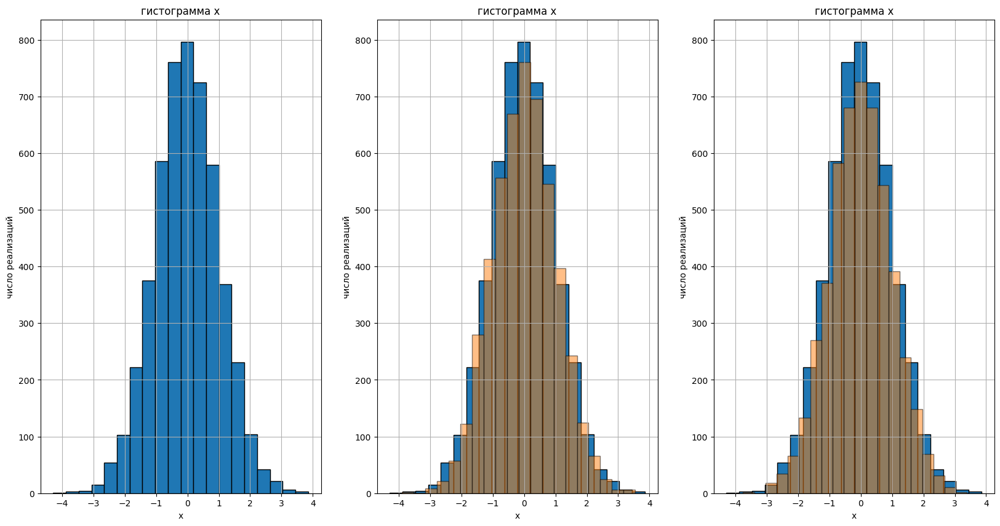

In [80]:
plt.figure(figsize=(20,10))
plt.subplot(1,3 ,1)
plt.hist (x, edgecolor='black', bins=20)
plt.xlabel('x')
plt.ylabel('число реализаций')
plt.grid()
plt.title('гистограмма х')
plt.subplot(1,3 , 2)
plt.hist (x, edgecolor='black', bins=20)
plt.hist (xn, edgecolor='black', bins=20, alpha=0.5)
plt.xlabel('x')
plt.ylabel('число реализаций')
plt.grid()
plt.title('гистограмма х')
plt.subplot(1,3, 3)
plt.hist (x, edgecolor='black', bins=20)
plt.hist (r, edgecolor='black', bins=20, alpha=0.5)
plt.xlabel('x')
plt.ylabel('число реализаций')
plt.grid()
plt.title('гистограмма х')
plt.show()

**Вывод**: данные из х похожи на гаусиан - это говорит о том, что они имеют нормальный характер распределнения (это соответствует истине. т.к. мы построили исходно именно нормальные данные)

Заданиие 0.1 : поменять число интервалов (bins от 3 до 100 - 4 варианта ) и оценить качественную картину (приносит или не приносит пользу при визуальном анализе)

Задание 0.2. :  выбрать наиболее информативный вариант анализа и обосновать выбор

**Q-Q диаграмма  (график квантиль-квантиль)**

Позволяет кроме принадлежности к заданному расспределению оценить:

- степень отклонения данных от теоретического распределения

- графически проиллюстрировать такие параметры как расположение данных, масштаб и скошенность. Читаем: медиану, дисперсию и наклон функции плотности распределения.

- сравнить две выборки между собой

- делать выводы, не основываясь на показателях типа p-value.

[визуализация q-q диаграммы из statsmodel](https://www.statsmodels.org/stable/generated/statsmodels.graphics.gofplots.qqplot.html)

в качестве аргументов передаем:
  - исследуемое распределение
  - указываем на теоретическое распределение (по умолчанию 0 нормальный закон)
  - устанавливаем параметры отображения и сопоставления теоретического и исследуемого распределения

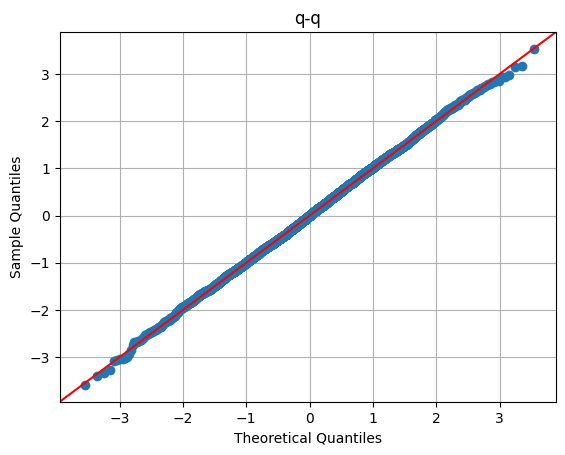

In [15]:


#create Q-Q plot with 45-degree line added to plot
fig = sm. qqplot (x, line='45')
plt.grid()
plt.title('q-q')
plt.show()

**Вывод:** данные из х разместились вдоль основной (теоретической) оси - это говорит о том, что они имеют нормальный характер распределнения (это соответствует истине. т.к. мы построили исходно именно нормальные данные)


Варианты опорной линии, с которой сравниваются данные:

- «45» — линия под углом 45 градусов

- «s» — стандартизированная линия, ожидаемые порядковые статистики масштабируются по стандартному отклонению данной выборки и к ним добавляется среднее значение

- «r» — построена линия регрессии

- «q» — линия проходит через квартили.

Если fit имеет значение True, то параметры опорного распределения (теоретического) подгоняются автоматически

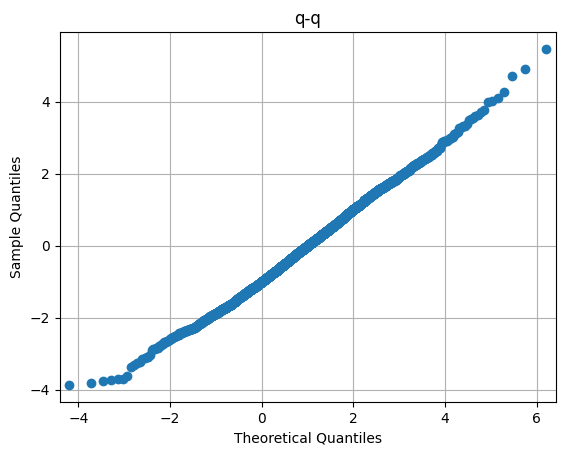

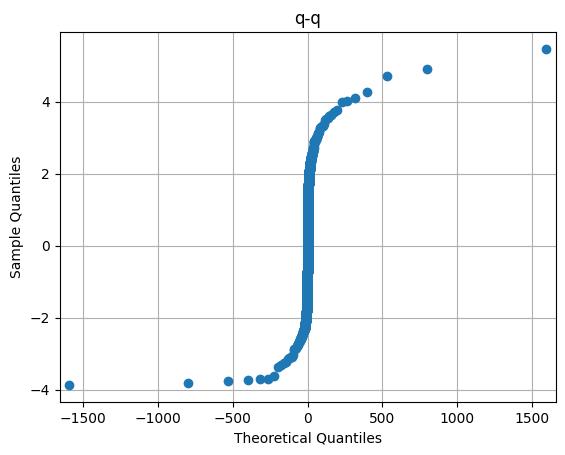

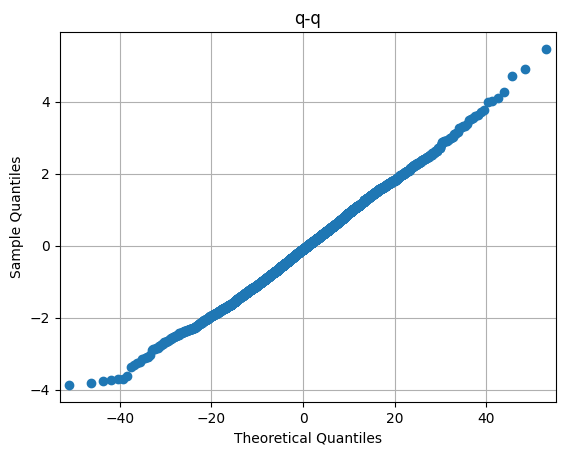

In [65]:

fig = sm.qqplot(r, stats.t, distargs=(10,), loc=1, scale=1)
plt.grid()
plt.title('q-q')
plt.show()
fig = sm.qqplot(r, stats.t, distargs=(1,), loc=1, scale=1)
plt.grid()
plt.title('q-q')
plt.show()
fig = sm.qqplot(r, stats.t, distargs=(10,), loc=1, scale=10)
plt.grid()
plt.title('q-q')
plt.show()

In [46]:
xr = stats.lognorm.rvs(1, size=5000)
xr

array([2.11838895, 1.4877593 , 1.42562272, ..., 0.8343233 , 1.40575531,
       0.61659653])

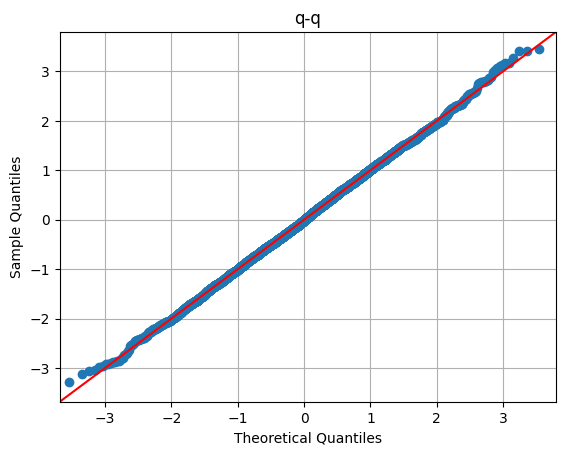

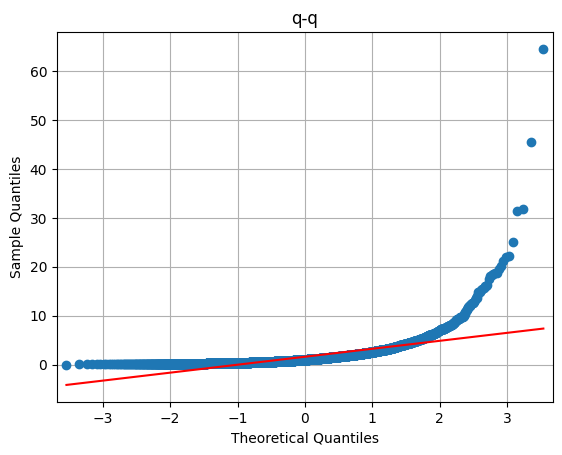

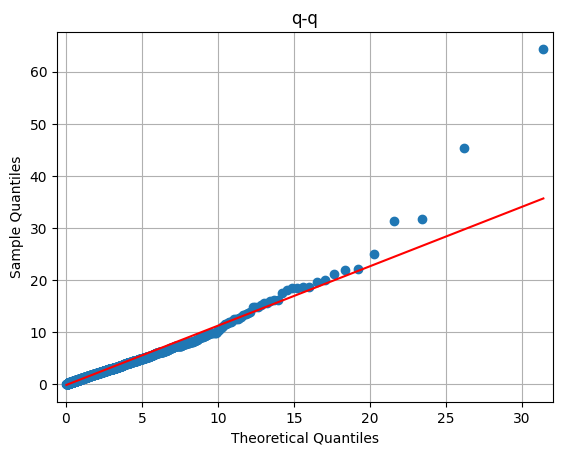

In [55]:

# 1 . нормальный по х и теоретический закон тоже нормальный
fig = sm.qqplot(x, stats.t,  fit=True,line="45")
plt.grid()
plt.title('q-q')
plt.show()
# 2 . lognorm распределение хr и теоретический закон  нормальный
fig = sm.qqplot(xr,  line="r")
plt.grid()
plt.title('q-q')
plt.show()
# 3. lognorm распределение хr и теоретический закон  lognorm
fig = sm.qqplot(xr, stats.lognorm, fit=True,  line="r")
plt.grid()
plt.title('q-q')
plt.show()

Задание 0.3 : задайте свой пример для анализа и оцените результат

#  2. Статистический анализ признаков

Использование статистических тестов и оценка их результатов в анализе признаков состоит в оценке типа распредеелния текущего признака и/или сравнении распределений нескольких признакаов друг с другом.

Проведение статистического теста состоит из следующих шагов:

  - подготовка таблиц с данными;
  - проверка типа распределения (только для параметрических тестов ) и условий применимости теста;
  - формулирование гипотез;
  - применение теста и оценка результата.

короткая инструкция по выборц стат.тестов : [типы стат.тестов](https://habr.com/ru/companies/otus/articles/805961/)

- выполнить тест Шапиро-Уилка (нулевая гипотеза : распределение нормально) или другие тесты нормальности

In [ ]:
stat, p = stats.shapiro(x)
print('shapiro result:',stat, p)

shapiro result: 0.9995572566986084 0.31651049852371216


p-значение меньше 0,05, отвергаем нулевую гипотезу теста Шапиро-Уилка.
p-значение > 0,05, не можем отвергнуть нулеую гипотезутеста Шапиро-Уилка.

Поскольку p-значение больше 0,05, не отвергаем нулевую гипотезу теста Шапиро-Уилка.


Колмогоров:

In [ ]:
stat, p = stats.kstest(x, 'norm')
print('Колмогоров result:',stat, p)

Колмогоров result: 0.019149206457095835 0.050454008972969144


Пирсон:

In [ ]:
stat, p = stats.normaltest(x) # Критерий согласия Пирсона
print(' Пирсон-тест: Statistics=%.3f, p-value=%.3f' % (stat, p))

 Пирсон-тест: Statistics=3.699, p-value=0.157


In [ ]:
alpha = 0.05 # уровень значимочти
if p > alpha:
    print('Принять гипотезу о нормальности')
else:
    print('Отклонить гипотезу о нормальности')

Принять гипотезу о нормальности


- **построим второй пример**: не нормальный (экспоненциальный ) закон распределения для x_e

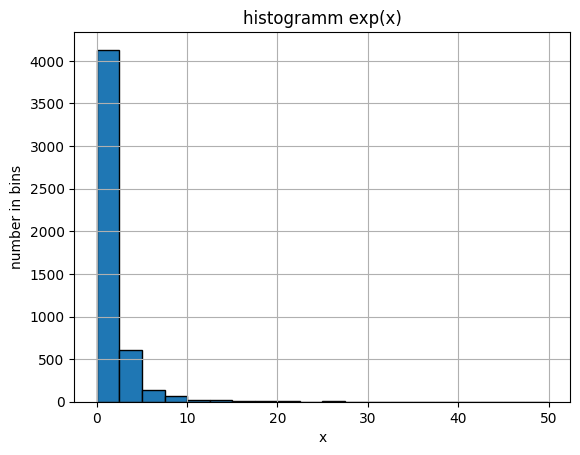

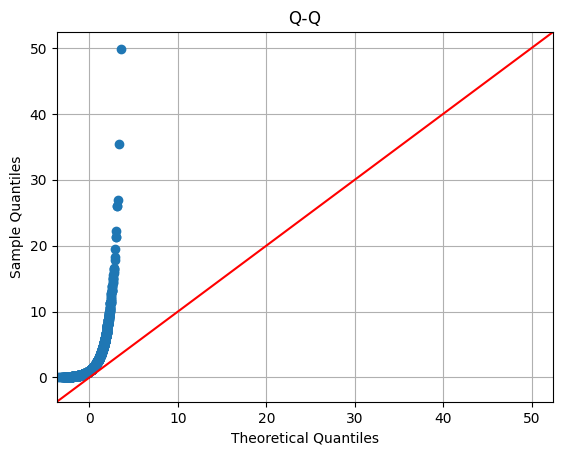

shapiro result: 0.5567348599433899 0.0
Колмогоров result: 0.019149206457095835 0.050454008972969144


In [ ]:
x_e = np.exp(x)

plt.hist (x_e, edgecolor='black', bins=20)
plt.xlabel('x')
plt.ylabel('number in bins')
plt.title('histogramm exp(x)')
plt.grid()
plt.show()

sm. qqplot (x_e, line='45')
plt.grid()
plt.title('Q-Q')
plt.show()



stat, p = stats.shapiro(x_e)
print('shapiro result:',stat, p)

stat, p = stats.kstest(x, 'norm')
print('Колмогоров result:',stat, p)


**Вывод:** данные из х_е не разместились вдоль основной (теоретической) оси - это говорит о том, что они имеют не нормальный характер распределнения (это соответствует истине. т.к. мы построили исходно именно не нормальные данные)


задание 0.4 : построить данные любому не нормальному закону распредеелния , выбрать тип стат.теста и оценить результат

# 3. Инструмены для визуального и статистического анализа

таблицы:

- Pandas
- [Pandas-profile (ydata-profiling)](https://docs.profiling.ydata.ai/latest/getting-started/installation/)
- [ Lux](https://lux-api.readthedocs.io/en/latest/source/getting_started/installation.html)

 статистика:
- [SciPy](https://docs.scipy.org/doc/scipy/tutorial/stats.html)
- [Statsmodel](https://www.statsmodels.org/stable/gettingstarted.html)

 Визуализации
- matplotlib
- seaborn




[данные](https://www.kaggle.com/datasets/camnugent/california-housing-prices) или из Googl Colaboratory '/content/sample_data/california_housing_train.csv'

In [92]:
# hhttps://www.kaggle.com/datasets/camnugent/california-housing-prices
df = pd.read_csv('/content/sample_data/california_housing_train.csv')

In [93]:
df

Button(description='Toggle Pandas/Lux', layout=Layout(top='5px', width='140px'), style=ButtonStyle())

Output()

Пример отчета по ydata_profiling (иногда долго, иногда нужно запустить ячейку 2 раза)

In [94]:
import pandas as pd
from ydata_profiling import ProfileReport

profile = ProfileReport(df, title="Pandas Profiling Report")
profile.to_widgets()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render widgets:   0%|          | 0/1 [00:00<?, ?it/s]

In [95]:
profile.to_notebook_iframe()

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Задание 0.5 : посмотрите на данные из примеров и оцените признаки по схеме :
  - диапазон признака
  - базовые статистики признака
  - нормальность признака
  - пропуски данных в признаке
  - корреляция с целевым признаком
  - корреляция между признаками

**Как обращаться с не нормальными данными**
Если данный пирзнак не имеет нормального распределения, мы часто можем выполнить одно из следующих преобразований, чтобы сделать его нормально распределенным:

0. выполнить нормализацию  ([ много полезных слов и примеров](https://habr.com/ru/articles/527334/))

1. Преобразование логарифмического типа: преобразование значений из x в log(x) или выполнить подбор оптимального варианта через алгоритмы типа [Бокса-Кокса](https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.PowerTransformer.html).

2. Преобразование квадратного корня: преобразование значений из x в √ x .

3. Преобразование кубического корня: преобразование значений от x до x^1/3 .

4. [Полиномиальные сборки х^p](https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.PolynomialFeatures.html)

5. использовать сложные перобразования (эмпирические)

#Scikit-Learn

Scikit-Learn — это Python-библиотека, разработанная David Cournapeau в 2007 году и содержит большое количество алгоритмов для задач, связанных с классификацией и машинным обучением в целом.

Scikit-Learn базируется на библиотеке SciPy, которую нужно установить перед началом работы

Установка:

In [ ]:
# !pip install scikit-learn # в колаборатории этого можно не делать, в своей локальной среде необходимо обеспечить установку пакета и всех его зависимостей


### Наборы данных

Для хранения наборов данных scikit learn  :
  - использует массивы в формате numpy.array ( из библиотеки NymPy)
  - использует разреженные матрицы в формате scipy.sparse (из библиотеки SciPy)
  - поддерживает формат хранения DataFrame из библиотеки Pandas
  - имеет функции, позволяющие считывать данные из внешних файлов в форматах txt, csv, json и так далее.
  - использует наборы данных, которые поставляются вместе с библиотекой. Это открытые общеизвестные данные:
      - **данные о стоимости жилья в Бостоне**: исходя из количества комнат и уровня преступности в городе, модель может вычислять цены на жилье;
      - **данные о результатах диагностики рака молочных желез** из города Висконсина: используются для выявления злокачественного или доброкачественного новообразования;
      - **датасет химических свойств вин**: исходя из этих свойств модель может определить тип вина.




### **Задание 1.** Знакомимся с методами получения данных внутри пакета scikit learn.

  1.1. Загрузить набор **стоимость жилья в Бостоне**.


In [ ]:
from sklearn.datasets import fetch_california_housing
import sklearn.datasets as datasets

V = fetch_california_housing(return_X_y=True)

In [ ]:
x = V[0]
y = V[1]
x.shape, y.shape  # x - описание объектов, у - стоимость объектов

((20640, 8), (20640,))

1.2. Вывести таблицу с описанием данных и определить характер целевого свойства и оценить полноту данных

1.3. Постоить гистограмму стоимости

1.4. построить гистограммы для признаков

1.5. Сделать визуальную оценку характера распределения

1.6. Оценить характер распределения опираясь на тесты нормальности

1.7. Определить основной набор статистик для х и у

1.8. Оцените факт наличия/отсутствия выбросов и охарактеризуйте качество данных (резюме предществующих пунктов )


In [ ]:
#1.2
pd.DataFrame(x).head()

,0,1,2,3,4,5,6,7
0,8.3252,41.0,6.984127,1.023810,322.0,2.555556,37.88,-122.23
1,8.3014,21.0,6.238137,0.971880,2401.0,2.109842,37.86,-122.22
2,7.2574,52.0,8.288136,1.073446,496.0,2.802260,37.85,-122.24
3,5.6431,52.0,5.817352,1.073059,558.0,2.547945,37.85,-122.25
4,3.8462,52.0,6.281853,1.081081,565.0,2.181467,37.85,-122.25


In [ ]:
pd.DataFrame(x).info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20640 entries, 0 to 20639
Data columns (total 8 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   0       20640 non-null  float64
 1   1       20640 non-null  float64
 2   2       20640 non-null  float64
 3   3       20640 non-null  float64
 4   4       20640 non-null  float64
 5   5       20640 non-null  float64
 6   6       20640 non-null  float64
 7   7       20640 non-null  float64
dtypes: float64(8)
memory usage: 1.3 MB


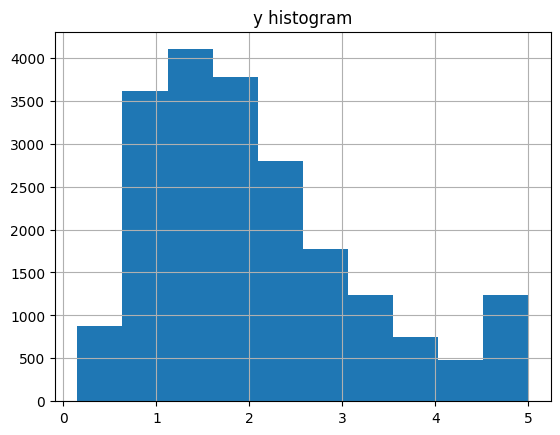

In [ ]:
#1.3
plt.hist(y)
plt.grid()
plt.title('y histogram')
plt.show()

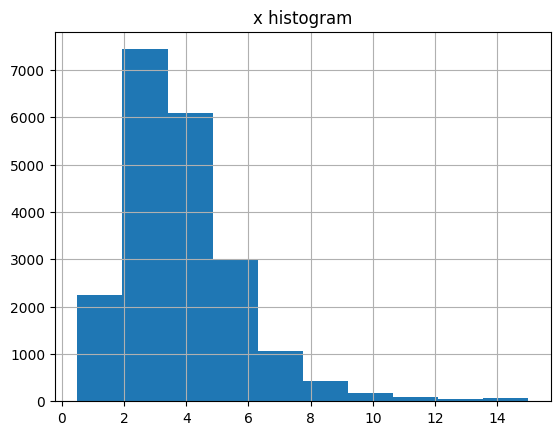

In [ ]:
#1.4
plt.hist(x[:,0])
plt.grid()
plt.title('x histogram')
plt.show()

1.5.  ...

Оценка характера распределения: ...

1.6 оценка через статистические тесты:

In [ ]:
# 1.6
stat, p = stats.shapiro(y)
p

/usr/local/lib/python3.10/dist-packages/scipy/stats/_morestats.py:1816: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


0.0

In [ ]:
# 1.7.

pd.DataFrame(y).describe()

,0
count,20640.000000
mean,2.068558
std,1.153956
min,0.149990
25%,1.196000
50%,1.797000
75%,2.647250
max,5.000010


In [ ]:
pd.DataFrame(x).describe()

,0,1,2,3,4,5,6,7
count,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000
mean,3.870671,28.639486,5.429000,1.096675,1425.476744,3.070655,35.631861,-119.569704
std,1.899822,12.585558,2.474173,0.473911,1132.462122,10.386050,2.135952,2.003532
min,0.499900,1.000000,0.846154,0.333333,3.000000,0.692308,32.540000,-124.350000
25%,2.563400,18.000000,4.440716,1.006079,787.000000,2.429741,33.930000,-121.800000
50%,3.534800,29.000000,5.229129,1.048780,1166.000000,2.818116,34.260000,-118.490000
75%,4.743250,37.000000,6.052381,1.099526,1725.000000,3.282261,37.710000,-118.010000
max,15.000100,52.000000,141.909091,34.066667,35682.000000,1243.333333,41.950000,-114.310000


1.8. Оценка набора данных:

-
-
-


Можно формировать синтетические наборы данных из datasets.make_classification (https://scikit-learn.org/stable/modules/generated/sklearn.datasets.make_classification.html#sklearn.datasets.make_classification). Каждый класс состоит из ряда гауссовых кластеров, каждый из которых расположен вокруг вершин гиперкуба в подпространстве размерности n_informative. Для каждого кластера информативные признаки рисуются независимо от N(0, 1), а затем случайным образом линейно комбинируются внутри каждого кластера для добавления ковариации. Затем кластеры размещаются в вершинах гиперкуба. Основные параметры для настройки генереируемых наборов:
  - n_samples=100, по умолчанию = 100
Количество образцов.
  - n_features=20, Общее количество признаков
  - n_informative=2, Количество информативных признаков.
  - n_redundant=2, Количество избыточных признаков (генерируются как случайные линейные комбинации информативных признаков)
  - n_classes=2,Количество классов (или меток) задачи классификации
  - n_clusters_per_class=2,Количество кластеров на класс
  - shuffle=True, Перемешаем объекты
  - random_state=None - зерно генератора случайных чисел


  Построим примеры синтетических наборов:



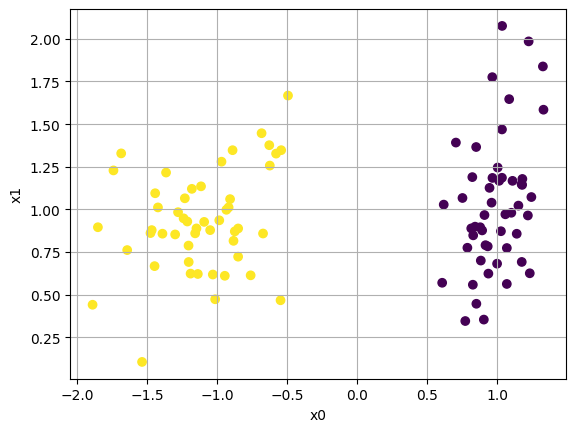

In [ ]:
# 100 примеров, 2 информативных признака, нет избыточных признаков, 2 класса и один кластер на класс

X, y = datasets.make_classification(n_features=2, n_redundant=0, n_informative=2,random_state=1, n_clusters_per_class=1)

plt.scatter(X[:,0],X[:,1],c = y)
plt.grid()
plt.xlabel('x0')
plt.ylabel('x1')
plt.show()

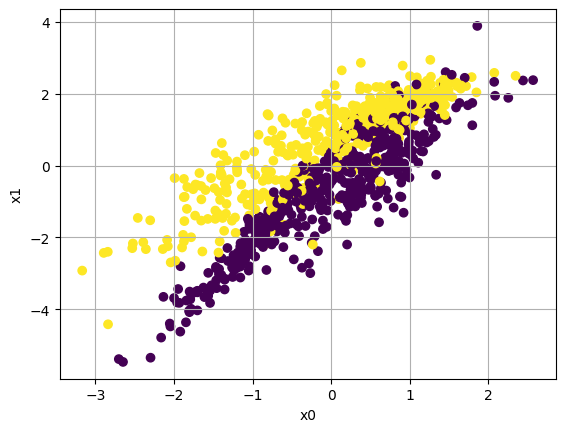

In [ ]:
# 1000 примеров, 10 информативных признака, 2 избыточных признакf, 2 класса и 2 кластер на класс

X, y = datasets.make_classification(n_samples = 1000, n_features=5, n_redundant=2, n_informative=2,random_state=1, n_clusters_per_class=2)

plt.scatter(X[:,0],X[:,1],c = y)
plt.grid()
plt.xlabel('x0')
plt.ylabel('x1')
plt.show()

Генерация гаусовой смеси через sklearn.datasets.make_blobs позволяет строить похожие на реальные еэкземпляры датасетов. Не является в явной форме классификационным набором данных, но можно успешно использовать для генерации синтетических данных классификационных задач, т.к. возвращает и описание объектов и у-принадлежность источнику. Позволит построить сравнительно сложные для классификации задачи.  Для настройки использует следующие параметры:

  - n_samples=100, по умолчанию = 100
Количество образцов.
  - n_features=20, Общее количество признаков
  - centers=None,Количество гаусовых источников (центров нормальных распределений для генерации данных)
  - cluster_std = 1.,характеристика рассеивания (стандартное отклонение)
  - shuffle=True, Перемешаем объекты
  - random_state=None - зерно генератора случайных чисел

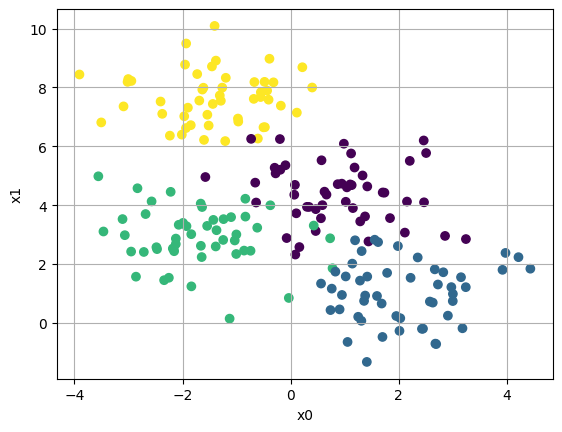

In [ ]:
X, y = datasets.make_blobs(n_samples=200, centers=4, n_features=2, random_state=0)

plt.scatter(X[:,0],X[:,1],c = y)
plt.grid()
plt.xlabel('x0')
plt.ylabel('x1')
plt.show()

### **Задание 2.** Знакомимся с методами генерации данных внутри пакета scikit learn.

2.1 Создать синтетический набор данных для классификации на основе datasets.make_classification с числом классов 3, 2 мя информативными признаками и 3-мя избыточными, определить по 2 кластера в каждом классе и число примеров 1000

2.2. Провести анализ полученных признаков : основные статистики, гистограммы, оценка нормальности

2.3 Создать синтетический набор данных для классификации на основе datasets.make_blobs с числом источников 3, 2-мя  признаками и числом примеров 1000

2.4. Провести анализ полученных признаков : основные статистики, гистограммы, оценка нормальности

### **Задание 3.**

Самостоятельно оценить данные по варианту:


In [ ]:

V1 = datasets.load_wine()
V2 = datasets.load_digits()
V3 = datasets.load_breast_cancer()
V4 = datasets.make_classification(n_samples = 10000, n_features=5, n_redundant=2, n_informative=2,random_state=10, n_clusters_per_class=2)
V5 = datasets.fetch_covtype(return_X_y=True)
V6 = datasets.make_blobs(n_samples=10000, centers=2, n_features=5, random_state=10)
V7 = datasets.make_circles(n_samples=10000, factor=0.5, noise=0.05)
V8 = datasets.make_moons(n_samples=10000, noise=0.05)


In [ ]:
V1.keys(), V2.keys(), V3.keys()

(dict_keys(['data', 'target', 'frame', 'target_names', 'DESCR', 'feature_names']),
 dict_keys(['data', 'target', 'frame', 'feature_names', 'target_names', 'images', 'DESCR']),
 dict_keys(['data', 'target', 'frame', 'target_names', 'DESCR', 'feature_names', 'filename', 'data_module']))

In [ ]:
V4[0][:2,:], V4[1][:2]

(array([[-1.53369129,  0.15903459,  0.0266148 , -0.76339466,  1.04238734],
        [ 0.15994651, -2.17701829, -1.19275252, -1.55325021,  0.00276112]]),
 array([0, 1]))

In [ ]:
V5[0][:2,:5], V5[1][:2]

(array([[ 2.596e+03,  5.100e+01,  3.000e+00,  2.580e+02,  0.000e+00],
        [ 2.590e+03,  5.600e+01,  2.000e+00,  2.120e+02, -6.000e+00]]),
 array([5, 5], dtype=int32))

In [ ]:
V6[0][:2,:5], V6[1][:2]

(array([[  6.04045034, -10.12182025,   3.18873994,   6.74561964,
           0.85746391],
        [  5.26263776,  -8.3128473 ,   2.6827971 ,   5.89951073,
           0.48186953]]),
 array([0, 0]))

In [ ]:
V7[0][:2,:5], V7[1][:2]

(array([[-0.12753014, -0.53077324],
        [ 0.83850362, -0.65087053]]),
 array([1, 0]))

 3.1.Загрузить данные  по варианту

 3.2.Опредлелить размер данных, их тип, полноту, получить основные статистики, постороить гистограммы и оценить нормальность признаков и целей

 3.3.сделать визуализацию для 2-х координат с метками цветом по классам

 3.4.сделать выводы о качестве данных